In [1]:
# Tarea de operaciones con geo data frames

In [2]:
# Se invoca al geopandas y se establece el mapa que se usará como base
import os

import geopandas as gpd
from  fiona import listlayers

CDRMaps='https://github.com/225225225225/simpleplot_MBC/raw/main/maps/CongoDRC.gpkg'
CDRMaps

'https://github.com/225225225225/simpleplot_MBC/raw/main/maps/CongoDRC.gpkg'

In [3]:
# Después, se revisa cuáles son los layers presentes
listlayers(CDRMaps)

['countries', 'cities', 'rivers']

In [4]:
# Finalmente, se asigna un nombre a cada layer en caso se necesiten usar por separado posteriormente
CDR=gpd.read_file(CDRMaps,layer='countries')
CDR_cities=gpd.read_file(CDRMaps,layer='cities')
CDR_rivers=gpd.read_file(CDRMaps,layer='rivers')

In [5]:
# La primera tarea es la siguiente:
# Determinar si el país es un polígono o multipolígono
# Extraer las fronteras del país
# Convertir a las fronteras en una gdf

In [6]:
# Primero, se invoca al país
CDR
# Es un polígono!

,COUNTRY,geometry
0,Democratic Republic of the Congo,"POLYGON ((16.09926 -5.85728, 15.92752 -5.85929..."


In [7]:
# Se revisan los parámetros del boundary de nuestro país
CDR.boundary

0    LINESTRING (16.09926 -5.85728, 15.92752 -5.859...
dtype: geometry

<Axes: >

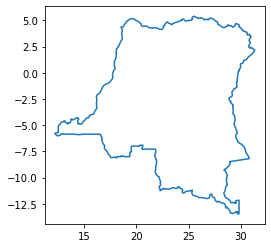

In [8]:
CDR.boundary.plot()

In [9]:
# Ahora, se revisa si las fronteras son un gdf
type(CDR.boundary)
# No lo son, son una geoserie!

geopandas.geoseries.GeoSeries

In [10]:
# Se convierten en una gdf
CDR_border=CDR.boundary.to_frame()
CDR_border

,0
0,"LINESTRING (16.09926 -5.85728, 15.92752 -5.859..."


In [11]:
# Ahora, hay que darle forma y establecer a la columna con la información relevante como 'geometry'
CDR_border['name']='Congo DR'
CDR_border.rename(columns={0:'geometry'},inplace=True) 
CDR_border = CDR_border.set_geometry("geometry")
# Finalmente, se revisa si todo está bien
CDR_border.crs

<Geographic 2D CRS: EPSG:4282>
Name: Pointe Noire
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Congo - onshore and offshore.
- bounds: (8.84, -6.91, 18.65, 3.72)
Datum: Congo 1960 Pointe Noire
- Ellipsoid: Clarke 1880 (IGN)
- Prime Meridian: Greenwich

In [12]:
# Finalmente, se invoca para ver cómo ha quedado
CDR_border

,geometry,name
0,"LINESTRING (16.09926 -5.85728, 15.92752 -5.859...",Congo DR


In [13]:
# Listo, parece ser que sí está bien

In [14]:
# La segunda tarea es la siguiente:
# Revisar las divisiones administrativas del país
# Revisar los sistemas de coordenadas de referencia de esas divisiones
# Corregir los CRS faltantes, si es necesario

In [15]:
# Primero, se usa la información de los shape files descargados
CDR_states=gpd.read_file(os.path.join("maps","cod_admbnda_rgc_itos_20190911_shp","cod_admbnda_adm1_rgc_itos_20190911.shp"))
CDR_municipalities=gpd.read_file(os.path.join("maps","cod_admbnda_rgc_itos_20190911_shp","cod_admbnda_adm2_rgc_20190911.shp"))

In [16]:
# Ahora, se revisa si tienen CRS
CDR_states.crs, CDR_municipalities.crs

(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [17]:
# Sí tienen, pero no es el mismo sistema que el de nuestras fronteras...
# Se cambia por el que se está usando que es 32734
CDR=CDR.to_crs(32734)
CDR_states=CDR_states.to_crs(32734)
CDR_municipalities=CDR_municipalities.to_crs(32734)

<Axes: >

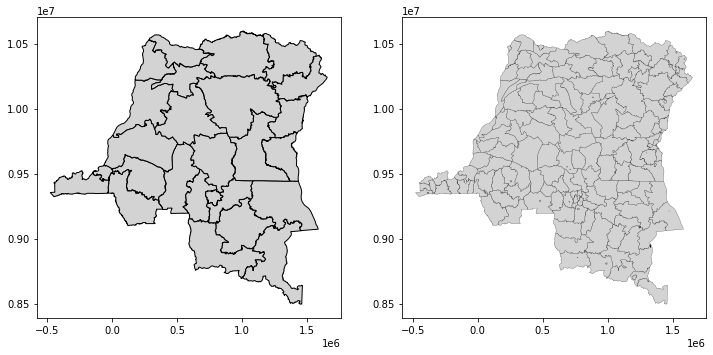

In [18]:
# Finalmente, se grafica para revisar si todo se ve bien

import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(12,12))

CDR_states.plot(ax=ax1, facecolor='lightgrey', edgecolor='black')
CDR_municipalities.plot(ax=ax2, facecolor='lightgrey', edgecolor='black',linewidth=0.2)


In [19]:
# La tercera tarea es la siguiente:
# Conseguir data en puntos en un archivo csv
# Guardar a los puntos como un objeto espacial
# Guardar el layer creado

In [20]:
# Yo no pude encontrar un archivo csv, pero sí uno xlsx, que debería de cumplir la misma función
import pandas as pd 
!pip install openpyxl
salud_raw=pd.read_excel(os.path.join('data', 'sub_saharan_health_facilities.xlsx'))
salud_raw

,Country,Admin1,Facility_n,Facility_t,Ownership,Lat,Long,LL_source
0,Angola,Bengo,Hospital Barra Do Dande,Hospital,Govt.,-8.6560,13.4919,Google Earth
1,Angola,Bengo,Hospital Dos Dembos,Hospital,Govt.,-8.5026,14.5862,Google Earth
2,Angola,Bengo,Hospital Municipal de Ambriz,Municipal Hospital,Govt.,-7.8522,13.1307,Google Earth
3,Angola,Bengo,Hospital Municipal de Bula Atumba,Municipal Hospital,Govt.,-8.6742,14.7925,Google Earth
4,Angola,Bengo,Hospital Municipal de Dande,Municipal Hospital,Govt.,-8.5835,13.6569,Google Earth
...,...,...,...,...,...,...,...,...
98740,Zimbabwe,Midlands,Zhombe Rural Hospital,Rural Hospital,FBO,-18.7034,29.3849,GPS
98741,Zimbabwe,Midlands,Zvamabande Rural Health Clinic,Rural Health Clinic,MoH,-19.8018,30.1359,GPS
98742,Zimbabwe,Midlands,Zvarota Rural Health Clinic,Rural Health Clinic,MoH,-19.5565,30.2212,GPS
98743,Zimbabwe,Midlands,Zvishavane District Hospital,District Hospital,MoH,-20.3058,30.0524,GPS


In [21]:
# Sin embargo, como se puede ver, no encontré los datos para solo Congo DR, sino para todo África!
# Hay que pulir un poco...
salud_CDR = salud_raw.loc[salud_raw['Country'] == 'Democratic Republic of the Congo', :]
salud_CDR

,Country,Admin1,Facility_n,Facility_t,Ownership,Lat,Long,LL_source
12555,Democratic Republic of the Congo,Bas-Uele,Abula Poste de Santé,Poste de Santé,Publique,3.5158,25.9614,Geonames
12556,Democratic Republic of the Congo,Bas-Uele,Adama Poste de Santé,Poste de Santé,Publique,4.7908,24.5871,Geonames
12557,Democratic Republic of the Congo,Bas-Uele,Adogolo Poste de Santé,Poste de Santé,Publique,3.4112,26.8736,GPS
12558,Democratic Republic of the Congo,Bas-Uele,Ahaupa Centre de Santé,Centre de Santé,Publique,2.6575,23.7988,GPS
12559,Democratic Republic of the Congo,Bas-Uele,Aketi Hôpital Général de Référence,Hôpital Général de Référence,Publique,2.7306,23.7852,Geonames
...,...,...,...,...,...,...,...,...
27136,Democratic Republic of the Congo,Tshuapa,Tu Yoseki Centre de Santé,Centre de Santé,Publique,0.6691,22.7978,GPS
27137,Democratic Republic of the Congo,Tshuapa,Tuyalusaka Centre de Santé de Référence,Centre de Santé,Publique,-0.9608,22.9702,GPS
27138,Democratic Republic of the Congo,Tshuapa,Wema Hôpital Général de Référence,Hôpital Général de Référence,Publique,-0.4851,21.6294,Google Earth
27139,Democratic Republic of the Congo,Tshuapa,Yalifafo Hôpital Général de Référence,Hôpital Général de Référence,Publique,-0.7639,22.3323,Google Earth


In [22]:
# Ahora, revisamos si faltan datos
salud_CDR.info()
# Parece que no falta nada 
# También, las latitudes y longitudes ya están como valores numéricos

<class 'pandas.core.frame.DataFrame'>
Index: 14586 entries, 12555 to 27140
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Country     14586 non-null  object 
 1   Admin1      14586 non-null  object 
 2   Facility_n  14586 non-null  object 
 3   Facility_t  14586 non-null  object 
 4   Ownership   14586 non-null  object 
 5   Lat         14586 non-null  float64
 6   Long        14586 non-null  float64
 7   LL_source   14586 non-null  object 
dtypes: float64(2), object(6)
memory usage: 1.0+ MB


In [23]:
# Ahora, se asignan como datos espaciales
Salud_CDR=gpd.GeoDataFrame(data=salud_CDR.copy(),
                 geometry=gpd.points_from_xy(salud_CDR.Long,
                                             salud_CDR.Lat), 
                 crs=4282)
Salud_CDR

,Country,Admin1,Facility_n,Facility_t,Ownership,Lat,Long,LL_source,geometry
12555,Democratic Republic of the Congo,Bas-Uele,Abula Poste de Santé,Poste de Santé,Publique,3.5158,25.9614,Geonames,POINT (25.96140 3.51580)
12556,Democratic Republic of the Congo,Bas-Uele,Adama Poste de Santé,Poste de Santé,Publique,4.7908,24.5871,Geonames,POINT (24.58710 4.79080)
12557,Democratic Republic of the Congo,Bas-Uele,Adogolo Poste de Santé,Poste de Santé,Publique,3.4112,26.8736,GPS,POINT (26.87360 3.41120)
12558,Democratic Republic of the Congo,Bas-Uele,Ahaupa Centre de Santé,Centre de Santé,Publique,2.6575,23.7988,GPS,POINT (23.79880 2.65750)
12559,Democratic Republic of the Congo,Bas-Uele,Aketi Hôpital Général de Référence,Hôpital Général de Référence,Publique,2.7306,23.7852,Geonames,POINT (23.78520 2.73060)
...,...,...,...,...,...,...,...,...,...
27136,Democratic Republic of the Congo,Tshuapa,Tu Yoseki Centre de Santé,Centre de Santé,Publique,0.6691,22.7978,GPS,POINT (22.79780 0.66910)
27137,Democratic Republic of the Congo,Tshuapa,Tuyalusaka Centre de Santé de Référence,Centre de Santé,Publique,-0.9608,22.9702,GPS,POINT (22.97020 -0.96080)
27138,Democratic Republic of the Congo,Tshuapa,Wema Hôpital Général de Référence,Hôpital Général de Référence,Publique,-0.4851,21.6294,Google Earth,POINT (21.62940 -0.48510)
27139,Democratic Republic of the Congo,Tshuapa,Yalifafo Hôpital Général de Référence,Hôpital Général de Référence,Publique,-0.7639,22.3323,Google Earth,POINT (22.33230 -0.76390)


<Axes: >

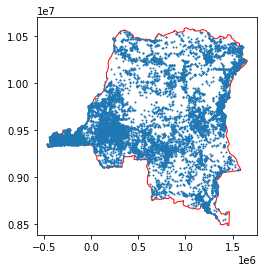

In [24]:
# Ahora, se pone a crs proyectada y se plotea para revisar si todo está bien

Salud_CDR = Salud_CDR.to_crs(32734)

base = CDR.plot(color='white', edgecolor='red')
Salud_CDR.plot(ax=base,markersize=1)

In [25]:
# Parece que está bien

In [26]:
# Se revisan los tipos de establecimientos de salud que hay
Salud_CDR['Ownership'].value_counts()

Ownership
Publique            14062
Confessionnel         365
ONG/non-lucratif      154
CBO                     5
Name: count, dtype: int64

In [27]:
# Ahora, si se quiere plottear en un mapa interactivo según la propiedad de los establecimientos de salud
from folium import LayerControl


m = Salud_CDR[Salud_CDR.Ownership=='Publique'].explore(color="red",name="Public",show=False)
m = Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].explore(m=m, color="blue",name="Private",show=False)
m = Salud_CDR[Salud_CDR.Ownership=='ONG/non-lucratif'].explore(m=m, color="black",name="NGO/Non Lucrative",show=True)
m = Salud_CDR[Salud_CDR.Ownership=='CBO'].explore(m=m, color="green",name="Community Based Organization",show=False)

LayerControl(collapsed=False).add_to(m) #optional

m

In [28]:
# Funciona bien!

In [29]:
# La cuarta tarea consiste en:
# Calcular el centroide del país
# Combinar todos los polígonos al norte y al sur del centroide
# Plotear los mapas juntos, para porder ver a los duplicados

In [30]:
# Primero, calculamos el centroide
cCDR=CDR.centroid
cCDR
# Este mensaje está raro, porque revisé que el crs esté proyectado y en la página sale que sí lo está

0    POINT (796123.697 9682766.487)
dtype: geometry

In [31]:
# Se revisa que sean datos numéricos
type(cCDR.x[0]),type(cCDR.y[0])

(numpy.float64, numpy.float64)

<Axes: >

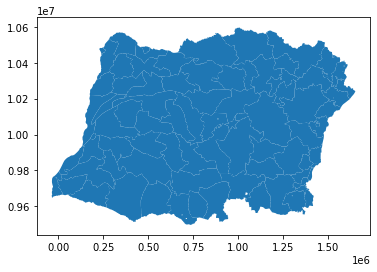

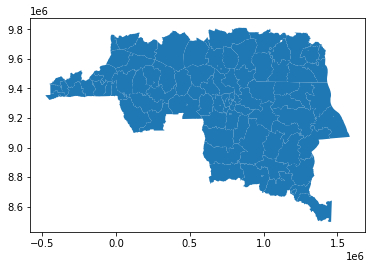

In [33]:
# Ahora, se define a los componentes del centro y se 'parte' al país en su norte y sur
centroidX=cCDR.x[0]
centroidY=cCDR.y[0]

CDR_municipalities.cx[:,centroidY:].plot(),

CDR_municipalities.cx[:,:centroidY].plot() 

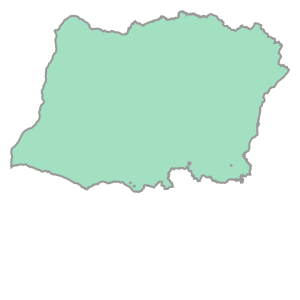

In [34]:
# Combinando norte
CDR_municipalities.cx[:,centroidY:].unary_union

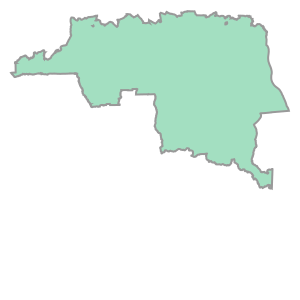

In [35]:
# Combinando sur
CDR_municipalities.cx[:,:centroidY].unary_union

In [39]:
# Ahora, se plotean juntos para ver las coincidencias
CDRTSP=CDR_municipalities.cx[:,centroidY:].dissolve()
CDRBSP=CDR_municipalities.cx[:,:centroidY].dissolve()

<Axes: >

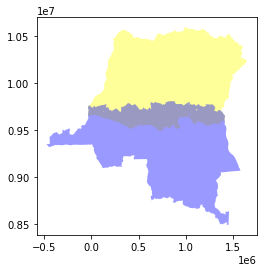

In [40]:
base=CDRTSP.plot(facecolor='yellow', alpha=0.4)
CDRBSP.plot(ax=base,facecolor='blue', alpha=0.4)

In [41]:
# La quinta tarea consiste en:
# Seleccionar algunos puntos (establecimientos de salud) en el mapa
# Crear un convex hull para estos
# Convertir al hull en una gdf
# Plotear el hull sobre el país

In [42]:
# Se marca a los puntos en función de a qué mitad pertenecen
CDRTSP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[:,centroidY:]
CDRBSP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[:,:centroidY]

<Axes: >

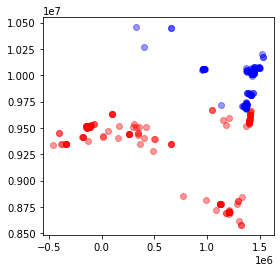

In [43]:
# Después, se plotean
base=CDRBSP.plot(facecolor='red', alpha=0.4)
CDRTSP.plot(ax=base,facecolor='blue', alpha=0.4)

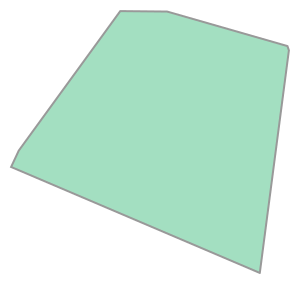

In [44]:
# Ahora, se crea un convex hull para los establecimientos privados de salud
CDR_PrivateHealth=Salud_CDR[Salud_CDR.Ownership=='Confessionnel']
CDR_PrivateHealth.unary_union.convex_hull

In [45]:
# Ahora, se convierte en una gdf
CDRPH_hull= gpd.GeoDataFrame(index=[0],
                                    crs=Salud_CDR.crs,
                                   geometry=[CDR_PrivateHealth.unary_union.convex_hull])
CDRPH_hull['name']='Establecimientos de Salud Privados'
CDRPH_hull

,geometry,name
0,"POLYGON ((1324486.830 8578215.304, -458494.641...",Establecimientos de Salud Privados


<Axes: >

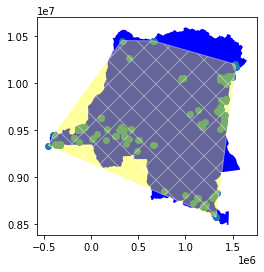

In [46]:
# Finalmente, se plotea todo junto
base=CDR.plot(facecolor='blue')
CDR_PrivateHealth.plot(ax=base)
CDRPH_hull.plot(ax=base,facecolor='yellow',
                       edgecolor='white',alpha=0.4,
                       hatch='X')

In [47]:
# La sexta tarea consiste en:
# Aplicar dos funciones de 'intersection, union, difference y symmetric difference' a mis mapas
# Aplicar dos de estas funciones entre hulls de los establecimientos de saludo

In [48]:
# Se decide usar las funciones intersección y unión para DR Congo por municipalidades

In [49]:
# Para la intersección

In [50]:
# Primero se establecen los mapas
munisCDR_N=CDR_municipalities.cx[:,centroidY:]
munisCDR_S=CDR_municipalities.cx[:,:centroidY]
munisCDR_E=CDR_municipalities.cx[centroidX:,:]
munisCDR_W=CDR_municipalities.cx[:centroidX,:]

In [51]:
# Después, se establece la intersección
munisCDR_NIS=munisCDR_N.overlay(munisCDR_S, how="intersection",keep_geom_type=True)

<Axes: >

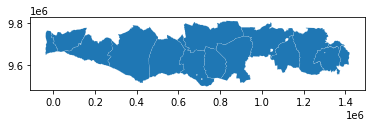

In [52]:
# Después, se grafica
munisCDR_NIS.plot(edgecolor='white',linewidth=0.1)

In [53]:
# Para la unión

In [54]:
# Se establece la unión
munisCDR_NUE=munisCDR_N.overlay(munisCDR_E,how="union",keep_geom_type=True)

<Axes: >

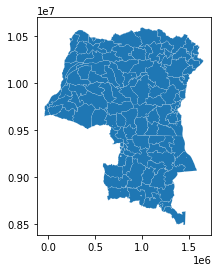

In [55]:
# Se plottea
munisCDR_NUE.plot(edgecolor='white',linewidth=0.1)

In [56]:
# Para los hulls

In [57]:
# Se crean subdivisiones para norte, sur, este y oeste para establecimientos privados de salud
CDR_NSP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[:,centroidY:]
CDR_SSP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[:,:centroidY]
CDR_ESP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[centroidX:,:]
CDR_OSP=Salud_CDR[Salud_CDR.Ownership=='Confessionnel'].cx[:centroidX,:]

In [58]:
# Se crean los hulls
CDR_NSP_hull=CDR_NSP.dissolve().convex_hull
CDR_SSP_hull=CDR_SSP.dissolve().convex_hull
CDR_ESP_hull=CDR_ESP.dissolve().convex_hull
CDR_OSP_hull=CDR_OSP.dissolve().convex_hull

In [59]:
# Ahora se convierten en gds
CDR_NSP_hull= gpd.GeoDataFrame(index=[0],
                                    crs=Salud_CDR.crs,
                                   geometry=[CDR_NSP.unary_union.convex_hull])
CDR_NSP_hull['name']='Establecimientos de Salud Privados'

CDR_SSP_hull= gpd.GeoDataFrame(index=[0],
                                    crs=Salud_CDR.crs,
                                   geometry=[CDR_SSP.unary_union.convex_hull])
CDR_SSP_hull['name']='Establecimientos de Salud Privados'

CDR_ESP_hull= gpd.GeoDataFrame(index=[0],
                                    crs=Salud_CDR.crs,
                                   geometry=[CDR_ESP.unary_union.convex_hull])
CDR_ESP_hull['name']='Establecimientos de Salud Privados'

CDR_OSP_hull= gpd.GeoDataFrame(index=[0],
                                    crs=Salud_CDR.crs,
                                   geometry=[CDR_OSP.unary_union.convex_hull])
CDR_OSP_hull['name']='Establecimientos de Salud Privados'

<Axes: >

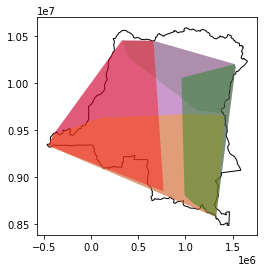

In [60]:
# Se grafican para ver cómo salieron
base = CDR.plot(color='white', edgecolor='black')
CDRPH_hull.plot(ax=base,facecolor='purple',alpha=0.4)
CDR_NSP_hull.plot(ax=base,facecolor='grey', alpha=0.4)
CDR_SSP_hull.plot(ax=base,facecolor='orange', alpha=0.4)
CDR_ESP_hull.plot(ax=base,facecolor='green', alpha=0.4)
CDR_OSP_hull.plot(ax=base,facecolor='red', alpha=0.4)

<Axes: >

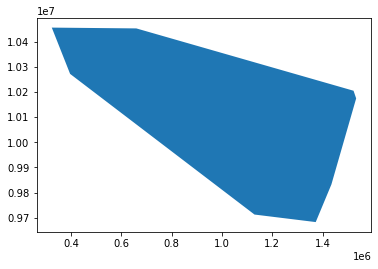

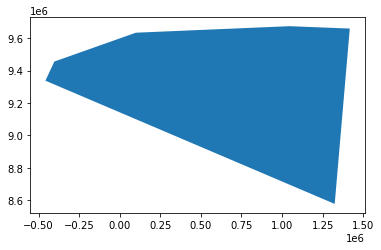

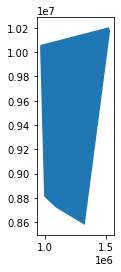

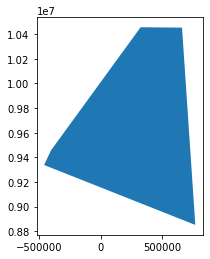

In [61]:
CDR_NSP_hull.plot(),
CDR_SSP_hull.plot(),
CDR_ESP_hull.plot(),
CDR_OSP_hull.plot()

<Axes: >

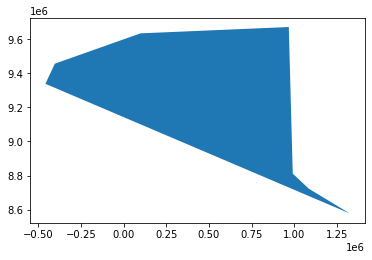

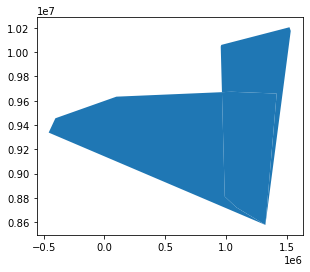

In [62]:
# Se Grafica la diferencia entre los hulls del sur y el este. Como referencia, también se pone la unión para que se pueda ver
# El efecto de la operación
CDR_SSP_hull.overlay(CDR_ESP_hull, how='difference').plot(),
CDR_SSP_hull.overlay(CDR_ESP_hull, how='union').plot()

<Axes: >

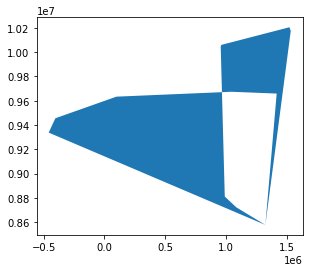

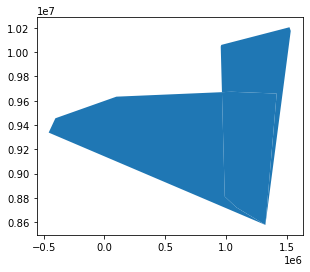

In [63]:
# Se Grafica la diferencia simétrica entre los hulls del sur y el este. Como referencia, también se pone la unión para que se pueda ver
# El efecto de la operación
CDR_SSP_hull.overlay(CDR_ESP_hull, how='symmetric_difference').plot(),
CDR_SSP_hull.overlay(CDR_ESP_hull, how='union').plot()

In [64]:
# Fin